<a href="https://colab.research.google.com/github/kicysh/final_task_of_world_model_lecture_2021/blob/main/docs/tmp/reproduction_paper_fig.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# pip

In [1]:
!pip install scanpy scikit-misc

# install ldvae
!git clone https://github.com/kicysh/final_task_of_world_model_lecture_2021/
!pip install final_task_of_world_model_lecture_2021/package/. --use-feature=in-tree-build

     |████████████████████████████████| 2.0 MB 14.2 MB/s 
     |████████████████████████████████| 8.8 MB 69.3 MB/s 
     |████████████████████████████████| 96 kB 5.6 MB/s 
     |████████████████████████████████| 86 kB 7.1 MB/s 
     |████████████████████████████████| 11.2 MB 65.1 MB/s 
     |████████████████████████████████| 899 kB 76.5 MB/s 
     |████████████████████████████████| 1.1 MB 67.2 MB/s 
     |████████████████████████████████| 63 kB 2.4 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82708 sha256=2ae25194e1370cb58d155fb5a6bb8d7af4a1a3769b546692066068e962ba9152
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.6-py3-none-any.whl size=53943 sha256=0b4d39484f953d2b96decf80761d9ce1f6848fdfafd9ade91ecf4f04fd9b731a
  Stored in directory: /root/.cache/pip/wheels/03/f1/56/f80d72741e400345b5a5b50ec3d929aca581bf45e0225d5c50
  Created

Cloning into 'final_task_of_world_model_lecture_2021'...
remote: Enumerating objects: 155, done.
remote: Counting objects: 100% (155/155), done.
remote: Compressing objects: 100% (149/149), done.
remote: Total 155 (delta 33), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (155/155), 13.94 MiB | 6.16 MiB/s, done.
Resolving deltas: 100% (33/33), done.
Processing ./final_task_of_world_model_lecture_2021/package
  Created wheel for LDVAE: filename=LDVAE-0.0.0-py3-none-any.whl size=3258 sha256=e0a04e5388e691a697a1956ba0299b94ab6c31cdb89a956ac3e1be8b0eea6310
  Stored in directory: /tmp/pip-ephem-wheel-cache-el7_t1up/wheels/e2/2f/44/da18d64c7ac8950bd4f266d145db33398678d80aff1a4f488f
Successfully built LDVAE


# data

In [2]:
!mkdir data figures
!gsutil cp gs://h5ad/2019-02-Pijuan-Sala-et-al-Nature/pijuan_sala_atlas.h5ad /content/data
path_of_data = '/content/data/pijuan_sala_atlas.h5ad'


Copying gs://h5ad/2019-02-Pijuan-Sala-et-al-Nature/pijuan_sala_atlas.h5ad...
\ [1 files][  1.0 GiB/  1.0 GiB]   49.9 MiB/s                                   
Operation completed over 1 objects/1.0 GiB.                                      


# setting


In [4]:
# setting
SETTING_BATCHNORM_EPS = 0.001
SETTING_BATCHNORM_MOMENTUM = 0.01
SETTING_ENCODER_Z_DROPOUT_P = 0.1
SETTING_ENCODER_L_DROPOUT_P = 0.1
SETTING_HIDDEN_DIM = 128
SETTING_EPS = 1e-8

USE_CUDA = True
SETTING_BATCH_SIZE = 1024

SETTING_N_TOP_GENES = 1000

path_of_data = '/content/data/pijuan_sala_atlas.h5ad'
w_csv_path = '/content/intermediate/w.csv'
z_csv_path = '/content/intermediate/z.csv'

RANDOM_SEED = 42

# model

In [5]:
import ldvae

import numpy as np
import pandas as pd

import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch import logsumexp
from torch.distributions import Normal, kl_divergence

import matplotlib.pyplot as plt

import scanpy as sc



In [6]:

adata = sc.read_h5ad(path_of_data)
adata

AnnData object with n_obs × n_vars = 139331 × 29452
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster'
    var: 'gene_name'

In [7]:
idx = adata.obs.query('not doublet').index
#idx = np.random.choice(idx, 20000, replace=False)
adata = adata[idx]
sc.pp.highly_variable_genes(adata,n_top_genes=1000 ,flavor='seurat_v3')
print(adata)
#sc.pp.filter_genes(adata, min_cells=100)


/usr/local/lib/python3.7/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


AnnData object with n_obs × n_vars = 125775 × 29452
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster'
    var: 'gene_name', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'


In [8]:
gene_index = adata.var[adata.var['highly_variable']].index

In [9]:
adata_df = adata.to_df()[gene_index]

In [9]:
#from math import ldexp

class LDVAE(nn.Module):
    """
    :param genes_cnt: Number of input genes
    :param latent_dim: Dimensionality of the latent space 
    """
    def __init__(
        self,
        genes_cnt: int, 
        latent_dim: int = 20
    ):
        super(LDVAE,self).__init__()
        self.local_l_mean = None
        self.local_l_std = None
        self.eps = SETTING_EPS

        self.theta = nn.Parameter(torch.randn(genes_cnt))
        self.encoder_z = nn.Sequential(
            nn.Linear(genes_cnt, SETTING_HIDDEN_DIM),
            nn.BatchNorm1d(SETTING_HIDDEN_DIM,
                           eps=SETTING_BATCHNORM_EPS, 
                           momentum=SETTING_BATCHNORM_MOMENTUM),
            nn.ReLU(),
            nn.Dropout(SETTING_ENCODER_Z_DROPOUT_P)
        )
        self.encoder_z_mean = nn.Linear(SETTING_HIDDEN_DIM,latent_dim)
        self.encoder_z_std = nn.Linear(SETTING_HIDDEN_DIM,latent_dim)

        self.encoder_l = nn.Sequential(
            nn.Linear(genes_cnt, SETTING_HIDDEN_DIM),
            nn.BatchNorm1d(SETTING_HIDDEN_DIM,
                           eps=SETTING_BATCHNORM_EPS, 
                           momentum=SETTING_BATCHNORM_MOMENTUM),
            nn.ReLU(),
            nn.Dropout(SETTING_ENCODER_L_DROPOUT_P)
        )
        self.encoder_l_mean = nn.Linear(SETTING_HIDDEN_DIM, 1)
        self.encoder_l_std = nn.Linear(SETTING_HIDDEN_DIM, 1)

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, genes_cnt,bias=False),#bias=False
            nn.BatchNorm1d(genes_cnt,
                           eps=SETTING_BATCHNORM_EPS, 
                           momentum=SETTING_BATCHNORM_MOMENTUM)
        )


    def forward(self,x):
        x_z = self.encoder_z(x)
        z_mean = self.encoder_z_mean(x_z)
        z_std = torch.exp(torch.clip(self.encoder_z_std(x_z),max=10)) 
        #z = Normal(z_mean, z_std.sqrt()).rsample()
        z_eps = torch.randn(z_mean.shape).to('cuda' if next(self.parameters()).is_cuda else 'cpu')
        z = z_mean + z_std * z_eps


        x_l = self.encoder_l(x)
        l_mean = self.encoder_l_mean(x_l)
        l_std = torch.exp(torch.clip(self.encoder_l_std(x_l),max=10))
        #library = Normal(l_mean, l_std.sqrt()).rsample()
        l_eps = torch.randn(l_mean.shape).to('cuda' if next(self.parameters()).is_cuda else 'cpu')
        library = (l_mean + l_std * l_eps)

        y = self.decoder(z)
        y = torch.exp(torch.clip(library,max=10))*torch.softmax(y, dim=-1)
        return [z_mean, z_std, z], [l_mean, l_std, library], y


    def set_local_l_mean_and_std(self, data):
        masked_log_sum =np.ma.log(data.sum(axis=1))
        log_counts = masked_log_sum.filled(0)
        self.local_l_mean = (np.mean(log_counts).reshape(-1, 1)).astype(np.float32)[0][0]
        self.local_l_std = (np.var(log_counts).reshape(-1, 1)).astype(np.float32)[0][0]
        return self.local_l_mean, self.local_l_std


    def reconst_error(self,x, mu, theta):
        eps = SETTING_EPS
        log_theta_mu_eps = torch.log(theta + mu + eps)

        res = (
            theta * (torch.log(theta + eps) - log_theta_mu_eps)
            + x * (torch.log(mu + eps) - log_theta_mu_eps)
            + torch.lgamma(x + theta)
            - torch.lgamma(theta)
            - torch.lgamma(x + 1)
        )
        return res


    def loss(self,x):
        zs,ls,y = self.forward(x)
        z_mean, z_std, z = zs
        l_mean, l_std, library = ls

        mean, std = torch.zeros_like(z_mean), torch.ones_like(z_std)
        kl_z = kl_divergence(Normal(z_mean,torch.sqrt(z_std)), Normal(mean, std)).sum(dim=1)

        mean, std = self.local_l_mean*torch.ones_like(l_mean), self.local_l_std*torch.ones_like(l_std)
        kl_l = kl_divergence(Normal(l_mean,torch.sqrt(l_std)), Normal(mean, torch.sqrt(std))).sum(dim=1)

        reconst = self.reconst_error(x, mu=y, theta=torch.exp(self.theta)).sum(dim=-1)        
        return reconst, kl_l ,kl_z

In [11]:
model = ldvae.LDVAE(genes_cnt = len(adata_df.columns),
                    hidden_dims=(128,),
                    latent_dim = 20)
model.set_local_l_mean_and_var(adata_df.values)
model

LDVAE(
  (encoder_z): Sequential(
    (0): Linear(in_features=1000, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.1, inplace=False)
  )
  (encoder_z_mean): Linear(in_features=128, out_features=20, bias=True)
  (encoder_z_var): Linear(in_features=128, out_features=20, bias=True)
  (encoder_l): Sequential(
    (0): Linear(in_features=1000, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.1, inplace=False)
  )
  (encoder_l_mean): Linear(in_features=128, out_features=1, bias=True)
  (encoder_l_var): Linear(in_features=128, out_features=1, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=20, out_features=1000, bias=False)
    (1): BatchNorm1d(1000, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
  )
)

In [12]:
class GenesDataset(torch.utils.data.Dataset):
    def __init__(self, 
                 adata, 
                 transform=None, 
                 target_transform=None):
        self.data = adata
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.data)

    def __getattr__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        data = self.data[idx]
        #label = self.img_labels.iloc[idx, 1]
        if self.transform:
            data = self.transform(data)
        #if self.target_transform:
        #    label = self.target_transform(label)
        return data

In [13]:
# dataloder
dataset = GenesDataset(adata_df.values)


n_samples = len(dataset) 
train_size = int(n_samples* 0.8)
val_size = int(n_samples * 0.2)
test_size = n_samples - train_size - val_size 

dataset_train ,dataset_valid, dataset_test = \
        torch.utils.data.random_split(dataset, [train_size, val_size,test_size])

dataloader_all = torch.utils.data.DataLoader(
    dataset,
    batch_size=SETTING_BATCH_SIZE,
    shuffle=False
)

dataloader_train = torch.utils.data.DataLoader(
    dataset_train,
    batch_size=SETTING_BATCH_SIZE,
    shuffle=True
)

dataloader_valid = torch.utils.data.DataLoader(
    dataset_valid,
    batch_size=SETTING_BATCH_SIZE,
    shuffle=True
)

#dataloader_test = torch.utils.data.DataLoader(
#    dataset_test,
#    batch_size=SETTING_BATCH_SIZE,
#    shuffle=True
#)

In [14]:
#from numpy.ma.core import nonzero
# train
#model = LDVAE(genes_cnt = len(adata_df.columns),
#              latent_dim = 20)
#model.set_local_l_mean_and_std(adata_df.values)
#model

n_epochs  = 100
optimizer = optim.Adam(model.parameters(), lr=7e-3)#  betas=(0.5,0.999))

device = 'cuda'  if USE_CUDA else 'cpu'
model.to(device)
#_x = nonzero

for epoch in range(n_epochs):
    losses = []

    model.train()
    for x in dataloader_train:
        x = x.to(device)
        #_x = x

        model.zero_grad()

        # forawrd and loss
        reconst, kl_l ,kl_z = model.loss(x)
        loss = torch.mean(-reconst+kl_l +kl_z)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        losses.append(loss.cpu().detach().numpy())

    losses_val1 = []
    losses_val2 = []
    losses_val3 = []

    model.eval()
    for x in dataloader_valid:

        x = x.to(device)


        reconst, kl_l ,kl_z = model.loss(x)

        losses_val1.append(torch.mean(-reconst).cpu().detach().numpy())
        losses_val2.append(torch.mean(kl_l).cpu().detach().numpy())
        losses_val3.append(torch.mean(kl_z).cpu().detach().numpy())

    print('EPOCH: %d    Train Loss: %lf    Valid rec: %lf    Valid kl_l: %lf    Valid kl_z: %lf' %
            (epoch+1, np.average(losses),np.average(losses_val1),np.average(losses_val2),np.average(losses_val3)))


EPOCH: 1    Train Loss: 1640.975952    Valid rec: 1144.026123    Valid kl_l: 7.231533    Valid kl_z: 13.842402
EPOCH: 2    Train Loss: 793.101624    Valid rec: 911.263611    Valid kl_l: 2.068665    Valid kl_z: 13.140733
EPOCH: 3    Train Loss: 697.089417    Valid rec: 820.125793    Valid kl_l: 1.521852    Valid kl_z: 12.880381
EPOCH: 4    Train Loss: 648.927734    Valid rec: 758.543213    Valid kl_l: 1.405339    Valid kl_z: 12.393523
EPOCH: 5    Train Loss: 617.486450    Valid rec: 715.882874    Valid kl_l: 1.501837    Valid kl_z: 12.756474
EPOCH: 6    Train Loss: 597.359436    Valid rec: 662.407104    Valid kl_l: 1.285619    Valid kl_z: 12.794983
EPOCH: 7    Train Loss: 582.573303    Valid rec: 614.956421    Valid kl_l: 1.143314    Valid kl_z: 12.789105
EPOCH: 8    Train Loss: 572.200378    Valid rec: 573.250854    Valid kl_l: 1.256238    Valid kl_z: 12.919082
EPOCH: 9    Train Loss: 563.277283    Valid rec: 549.740540    Valid kl_l: 1.261186    Valid kl_z: 12.686459
EPOCH: 10    Trai

In [15]:
# w
import pandas as pd

_w = model.decoder[0].weight
bn = model.decoder[1]
sigma = torch.sqrt(bn.running_var + bn.eps)
gamma = bn.weight
b = gamma / sigma
bI = torch.diag(b)
loadings = torch.matmul(bI, _w)
loadings = loadings.detach().cpu().numpy()

W = pd.DataFrame(loadings, index=gene_index)
W.to_csv('/content/w.csv')


In [16]:
W

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
index,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000025902,0.359769,-0.313604,-0.848613,0.350431,0.993346,0.321700,0.816797,0.478478,0.104353,-1.526808,0.145446,-0.480908,0.531873,-0.604307,0.408025,0.176317,0.345761,-0.201671,-0.861563,-0.715314
ENSMUSG00000025927,-0.931707,-0.934603,-0.951199,-0.844221,-0.116587,-1.898248,-1.359455,1.160689,0.498008,1.163305,0.869897,0.431241,0.410771,0.418339,0.841225,0.366381,-0.591908,-0.085694,1.832718,0.056624
ENSMUSG00000026124,0.543238,-0.083664,0.454930,1.261773,-0.846930,-0.924069,0.577943,0.014632,-0.103260,-1.216451,-0.130792,-0.059613,0.125340,0.100317,-0.103895,-0.042359,-0.202890,-0.181023,-1.162151,-0.418536
ENSMUSG00000026043,0.132955,0.401844,-0.338882,-0.565259,-0.163040,-2.543116,-0.905147,-0.757579,0.399620,-0.219234,0.702890,-0.066095,0.025680,-0.224819,0.150407,-0.343470,-0.878011,-0.141058,1.227317,0.057361
ENSMUSG00000045954,1.003009,0.250256,0.546282,-0.200951,0.336050,-1.994478,-0.345762,0.140738,0.193461,0.271238,0.740808,0.448719,-0.196992,0.375475,0.279246,-0.109830,-0.143817,0.192372,0.810052,-0.006452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000100417,-0.225318,0.406970,-0.054303,0.302690,-0.036168,-0.526181,0.117767,0.054402,-0.090275,0.651708,0.007492,-0.159118,0.063827,0.067114,0.156126,-0.119278,-0.350233,-0.150941,-0.760477,0.438207
ENSMUSG00000025219,-0.639234,0.022894,-0.563649,0.764046,0.120635,-1.295762,0.099283,-0.252425,-0.273775,0.261594,-0.294527,-0.465207,-0.279796,0.141594,-0.947838,0.263551,0.822177,0.352774,-2.514601,-0.478309
ENSMUSG00000025068,-0.476639,0.010291,0.118917,0.313630,0.029734,0.575506,-0.108929,-0.031352,-0.219340,0.850285,-0.139622,-0.102147,0.048038,-0.031768,0.130033,0.115610,-0.025309,0.058254,0.192452,0.354603


In [17]:
latent_array  = None
model.eval()
for x in dataloader_all:
    x = x.to(device)
    _z,_,_ = model(x)
    z_mean,_,_ = _z
    z_mean = z_mean.cpu().detach().numpy()
    if latent_array is None:
        latent_array = z_mean
    else:
        latent_array = np.concatenate([latent_array, z_mean])
pd.DataFrame(latent_array,index=adata_df.index).to_csv('/content/z.csv')

In [18]:
pd.DataFrame(latent_array,index=adata_df.index)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
index,,,,,,,,,,,,,,,,,,,,
cell_1,0.193477,-0.026397,0.234246,-0.210319,0.037895,0.285907,0.046756,-0.639475,0.397438,0.762323,0.019761,-0.409855,-0.056426,0.167874,0.127072,-0.277585,-0.831669,-0.138448,-1.000847,0.184223
cell_2,0.027774,0.089427,-0.916673,0.458986,-0.161448,0.159386,0.450067,-0.084953,-0.373228,0.358159,-0.532702,-0.123536,0.226222,0.020206,-0.307845,-0.529861,-0.104520,0.252503,-1.181715,-0.045821
cell_3,0.522698,-0.933456,0.514052,0.255703,-0.218378,0.903370,1.537785,-0.993353,0.979901,-1.107642,-0.033524,-0.158377,0.609159,0.264065,0.039029,2.621408,0.718317,1.631425,-0.207594,-1.049034
cell_4,0.252859,-0.691565,-0.320641,-0.003726,-0.102768,0.219683,-0.014127,-1.043775,-0.770672,0.328871,-0.360500,-0.142275,0.417324,-0.298045,-0.388030,0.897085,0.005017,1.676633,-1.420020,0.053225
cell_5,0.280868,0.303954,-0.173905,0.717342,0.174713,1.241693,-0.321707,-0.344526,0.288241,1.275235,-0.107399,-0.076473,0.427780,-0.004647,-0.083958,0.536146,-0.030917,0.303577,0.947300,-0.350570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_139327,-0.100201,-0.165665,0.053948,-2.061510,-1.164078,0.093061,0.059036,-0.524053,-0.355188,-0.298205,-1.641086,0.694813,-0.134364,0.267869,0.124692,0.215718,-0.244286,-0.437115,1.110665,-0.620755
cell_139328,-0.716391,-1.208110,-0.761195,-0.174115,0.297389,-0.756556,-0.280721,-0.326708,-0.404708,0.188008,-0.099001,0.347056,1.072844,0.158529,0.600734,1.143130,-0.688191,0.437160,0.484750,0.281420
cell_139329,-1.088039,0.278777,0.076258,0.019664,-0.204420,-1.140736,-1.040258,-1.881963,0.348181,-0.194424,-0.384230,0.267049,-0.480747,-1.175700,-0.381476,0.347473,0.925652,0.381742,0.595711,-0.375682


In [19]:
import pandas as pd

w_df = pd.read_csv('/content/w.csv', index_col=0)
z_df = pd.read_csv('/content/z.csv', index_col=0)

In [20]:
w_df = w_df.add_prefix('w')
z_df = z_df.add_prefix('z')

In [21]:
%pylab inline
%config InlineBackend.figure_format ='retina'

import time

import anndata
import matplotlib.colors as mcolors
import pandas as pd

import plotnine as p


Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['gamma', 'random']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [22]:
def Z_covariance(Z):
    Zcentered = Z - Z.mean(0)
    Zscaled = Z / Z.std(0)
    ZTZ = np.cov(Zscaled.T)
    
    eigen_values, _ = np.linalg.eig(ZTZ)
    singular_values = np.sqrt(eigen_values)
    variance_explained = singular_values / singular_values.sum()

    return ZTZ, variance_explained

In [23]:
_, variance_explained = Z_covariance(z_df)
idx = np.argsort(variance_explained)[::-1]


In [24]:
Z_df_ordered = pd.DataFrame(z_df.values[:, idx]).add_prefix('z')
Z_df_ordered.index = z_df.index
W_df_ordered = pd.DataFrame(w_df.values[:, idx]).add_prefix('w')
W_df_ordered.index = w_df.index

In [25]:
adata = anndata.read('/content/data/pijuan_sala_atlas.h5ad')

In [26]:
W_df_ordered = adata.var.loc[W_df_ordered.index].join(W_df_ordered)

In [27]:
def make_kde(x1, x2):
    dx1 = (x1.max() - x1.min()) / 10
    dx2 = (x2.max() - x2.min()) / 10

    x1min = x1.min() - dx1
    x2min = x2.min() - dx2
    x1max = x1.max() + dx1
    x2max = x2.max() + dx2

    xx1, xx2 = np.mgrid[x1min:x1max:100j, x2min:x2max:100j]

    positions = np.vstack([xx1.ravel(), xx2.ravel()])
    values = np.vstack([x1, x2])

    kernel = stats.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx1.shape)
    
    return xx1, xx2, f


In [28]:
metadata = adata.obs.loc[Z_df_ordered.index]
metadata = metadata.join(Z_df_ordered)

for ctype in np.unique(metadata['celltype']):
    z_corrs = Z_df_ordered.corrwith((metadata['celltype'] == ctype))
    top_factors = z_corrs.map(np.abs).sort_values(ascending=False).head(3)
    print([f'{z.rjust(3)}: {z_corrs[z]:+.2f}' for z in top_factors.index], ctype)
    
vardata = W_df_ordered

['z11: -0.25', ' z0: +0.24', ' z6: -0.18'] Allantois
['z12: -0.23', ' z3: +0.13', 'z10: -0.12'] Anterior Primitive Streak
['z18: +0.21', ' z4: +0.15', ' z0: +0.11'] Blood progenitors 1
[' z4: +0.26', 'z15: -0.26', ' z2: -0.20'] Blood progenitors 2
[' z7: -0.61', 'z14: +0.16', ' z6: +0.15'] Cardiomyocytes
[' z9: +0.25', 'z14: +0.06', ' z6: +0.06'] Caudal Mesoderm
[' z9: +0.29', 'z14: +0.15', ' z1: +0.12'] Caudal epiblast
['z14: +0.11', ' z1: +0.11', ' z0: -0.08'] Caudal neurectoderm
['z12: -0.27', 'z13: +0.12', ' z3: +0.11'] Def. endoderm
['z18: +0.44', ' z6: +0.20', ' z1: -0.15'] Endothelium
['z10: -0.56', ' z5: +0.28', ' z9: -0.26'] Epiblast
[' z2: -0.35', 'z15: -0.33', 'z10: +0.18'] Erythroid1
[' z2: -0.26', 'z15: -0.22', 'z10: +0.13'] Erythroid2
[' z2: -0.45', 'z15: -0.37', 'z10: +0.26'] Erythroid3
['z17: +0.53', ' z5: +0.48', ' z2: +0.37'] ExE ectoderm
[' z5: -0.72', 'z17: +0.52', 'z15: +0.24'] ExE endoderm
['z14: -0.20', 'z18: -0.19', 'z17: -0.15'] ExE mesoderm
[' z0: -0.30', ' z8

In [ ]:
from matplotlib.patches import Ellipse
from scipy import stats

vardata = W_df_ordered



In [ ]:
def create_fig_0(num):
    plt.figure()
    figsize(7, 12 / 5)

    plt.subplot(1, 2, 1)

    plt.hist2d(
        Z_df_ordered[f'z'+str(num[0])], Z_df_ordered[f'z'+str(num[1])],
        bins=256,
        norm=mcolors.PowerNorm(0.25),
        cmap=cm.gray_r,
        rasterized=True
    )

    plt.axis('equal')
    plt.xlabel('$Z_{}$ '.format(num[0]) + f'({variance_explained[idx][num[0]]:.1%} variance)')
    plt.ylabel('$Z_{}$ '.format(num[1]) + f'({variance_explained[idx][num[1]]:.1%} variance)')

    ax = plt.gca()

    color_maps = [cm.Reds_r, cm.Blues_r, cm.Greens_r]
    cell_types = ['Erythroid3', 'ExE endoderm', 'Epiblast']
    for color, ctype in zip(color_maps, cell_types):
        X = metadata.query('celltype == @ctype')[['z'+str(num[0]), 'z'+str(num[1])]]
        xx1, xx2, f = make_kde(X['z'+str(num[0])], X['z'+str(num[1])])
        cset = ax.contour(
            xx1,
            xx2,
            f,
            levels=6,
            cmap=color,
            linewidths=1.
        )

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    plt.subplot(1, 2, 2)

    plt.scatter(
        W_df_ordered['w'+str(num[0])], W_df_ordered['w'+str(num[1])],
        c='lightgrey',
        rasterized=True
    )


    arrows = []
    genes = ['Hbb-bs', 'Hbb-bt', 'Hba-a2']
    for g in genes:
        x_, y_ = vardata.query('gene_name == @g')[['w'+str(num[0]), 'w'+str(num[1])]].values[0]

        arrows.append(plt.arrow(0, 0, x_, y_, length_includes_head=True, color='r'))
        
    plt.text(0, 2, '\n'.join(genes), color='r')

    arrows = []
    genes = ['Pou5f1', 'Tdgf1', 'Snrpn']
    for g in genes:
        x_, y_ = vardata.query('gene_name == @g')[['w'+str(num[0]), 'w'+str(num[1])]].values[0]

        arrows.append(plt.arrow(0, 0, x_, y_, length_includes_head=True, color='g'))

    plt.text(1, -1.5, '\n'.join(genes), color='g')

    arrows = []
    genes = ['Ctsh', 'Amn', 'Apoa4']
    for g in genes:
        x_, y_ = vardata.query('gene_name == @g')[['w'+str(num[0]), 'w'+str(num[1])]].values[0]

        arrows.append(plt.arrow(0, 0, x_, y_, length_includes_head=True, color='b'))

    plt.text(-2.6, -0.5, '\n'.join(genes), color='b')


    plt.xlim(left=-3, right=3)
    plt.ylim(bottom=-3, top=3)

    plt.xlabel('$W_{}$'.format(num[0]))
    plt.ylabel('$W_{}$'.format(num[1]))

    ax = plt.gca()

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    plt.savefig('figures/linear_pij_results_celltypes_{}_{}.pdf'.format(*num), bbox_inches='tight', dpi=400)



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warnin

KeyboardInterrupt: ignored

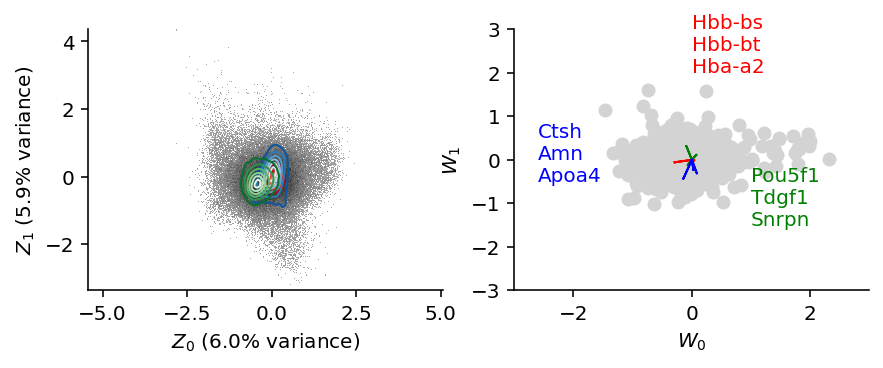

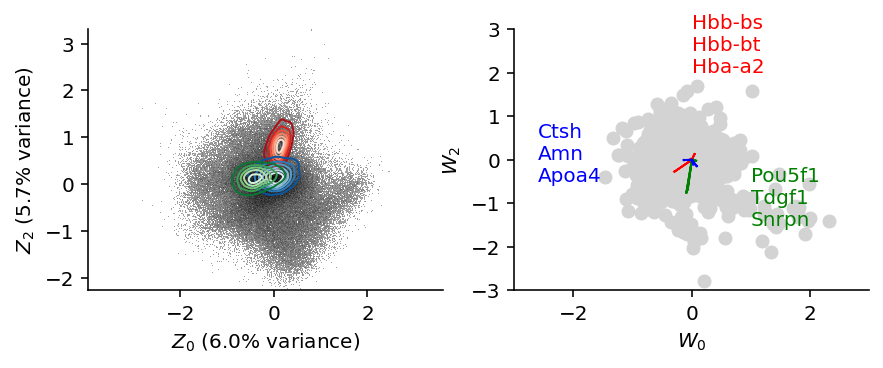

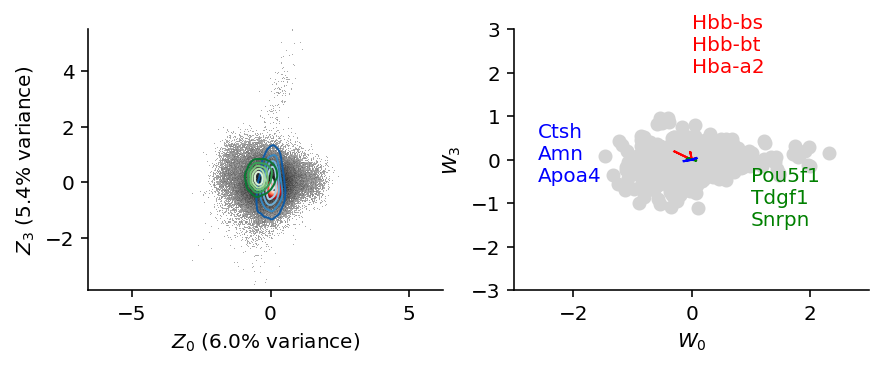

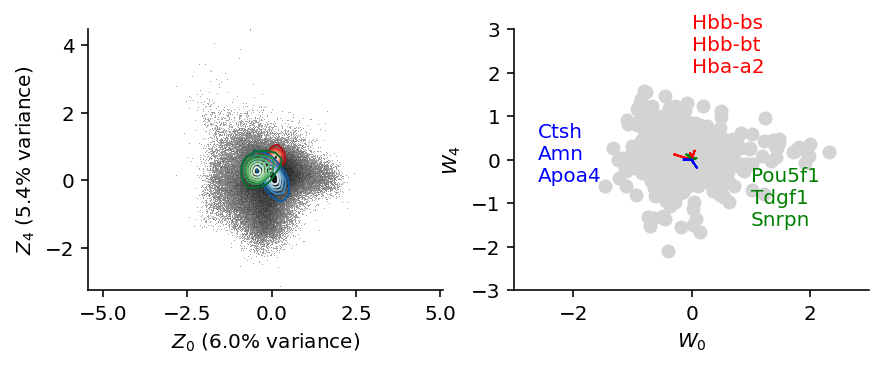

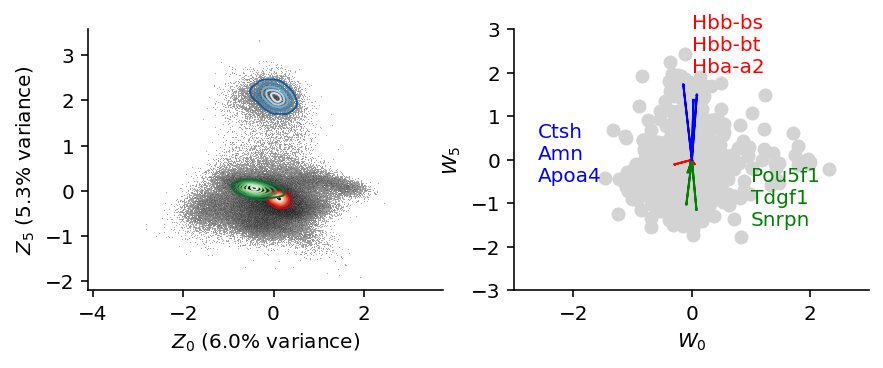

...

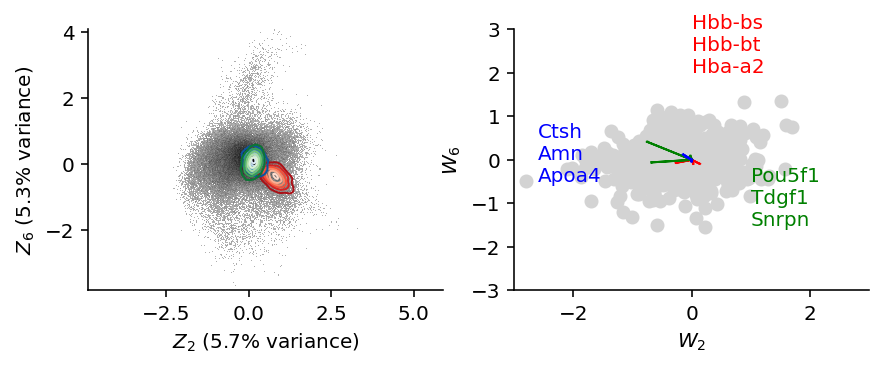

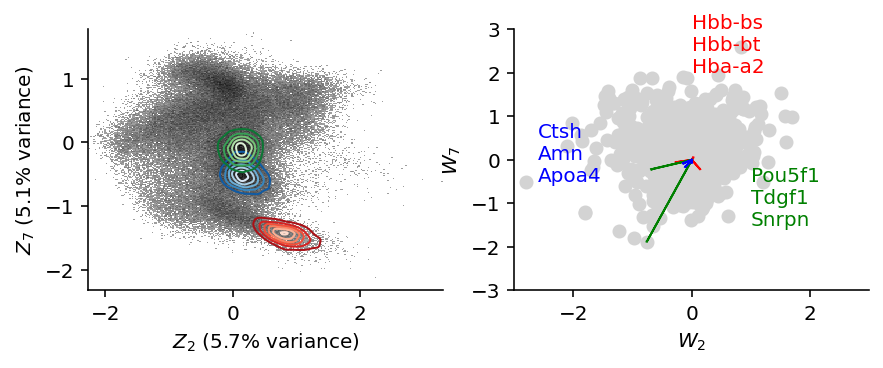

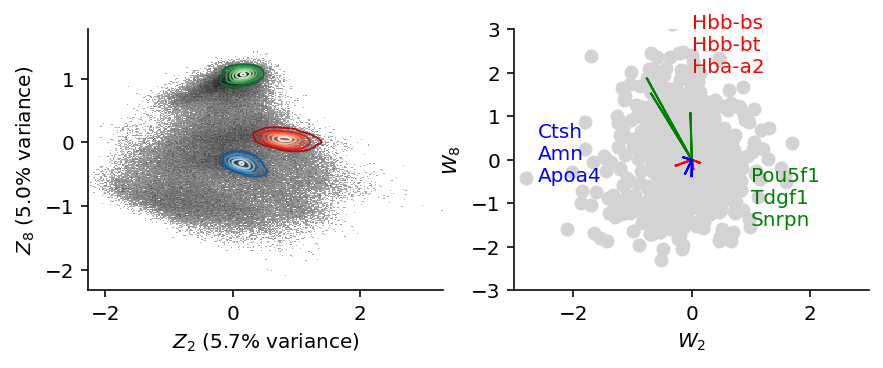

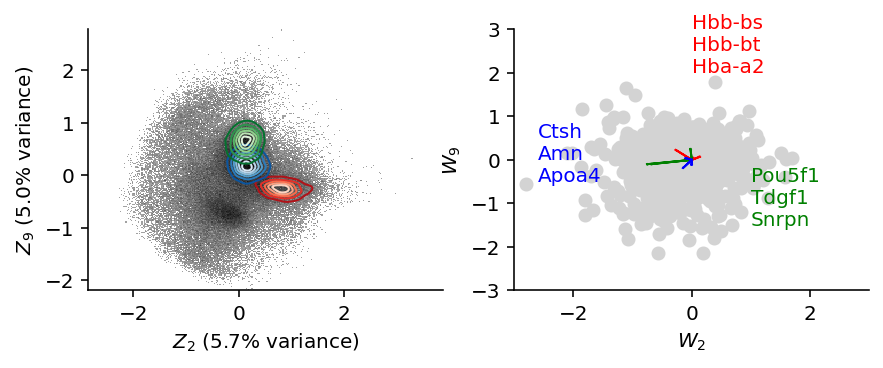

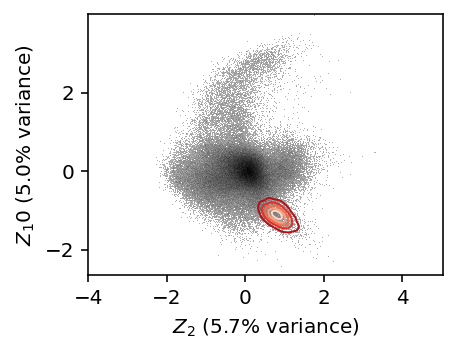

In [ ]:
for i in range(20):
    for j in range(i+1,20):
        create_fig_0((i,j))

In [ ]:
# ダウンロードしたいフォルダを zip 圧縮する
!zip -r /content/download.zip /content/figures

# 圧縮した zip ファイルをダウンロードする
from google.colab import files
files.download("/content/download.zip")

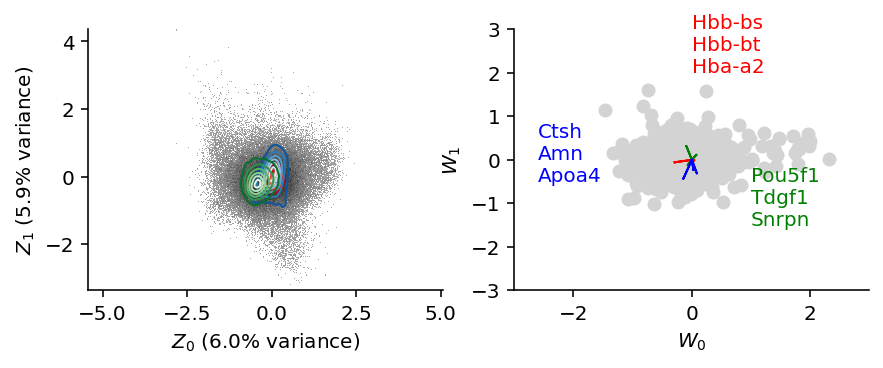

In [ ]:
num = (0,1)

figsize(7, 12 / 5)

plt.subplot(1, 2, 1)

plt.hist2d(
    Z_df_ordered[f'z'+str(num[0])], Z_df_ordered[f'z'+str(num[1])],
    bins=256,
    norm=mcolors.PowerNorm(0.25),
    cmap=cm.gray_r,
    rasterized=True
)

plt.axis('equal')
plt.xlabel('$Z_{}$ '.format(num[0]) + f'({variance_explained[idx][num[0]]:.1%} variance)')
plt.ylabel('$Z_{}$ '.format(num[1]) + f'({variance_explained[idx][num[1]]:.1%} variance)')

ax = plt.gca()

color_maps = [cm.Reds_r, cm.Blues_r, cm.Greens_r]
cell_types = ['Erythroid3', 'ExE endoderm', 'Epiblast']
for color, ctype in zip(color_maps, cell_types):
    X = metadata.query('celltype == @ctype')[['z'+str(num[0]), 'z'+str(num[1])]]
    xx1, xx2, f = make_kde(X['z'+str(num[0])], X['z'+str(num[1])])
    cset = ax.contour(
        xx1,
        xx2,
        f,
        levels=6,
        cmap=color,
        linewidths=1.
    )

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.subplot(1, 2, 2)

plt.scatter(
    W_df_ordered['w'+str(num[0])], W_df_ordered['w'+str(num[1])],
    c='lightgrey',
    rasterized=True
)


arrows = []
genes = ['Hbb-bs', 'Hbb-bt', 'Hba-a2']
for g in genes:
    x_, y_ = vardata.query('gene_name == @g')[['w'+str(num[0]), 'w'+str(num[1])]].values[0]

    arrows.append(plt.arrow(0, 0, x_, y_, length_includes_head=True, color='r'))
    
plt.text(0, 2, '\n'.join(genes), color='r')

arrows = []
genes = ['Pou5f1', 'Tdgf1', 'Snrpn']
for g in genes:
    x_, y_ = vardata.query('gene_name == @g')[['w'+str(num[0]), 'w'+str(num[1])]].values[0]

    arrows.append(plt.arrow(0, 0, x_, y_, length_includes_head=True, color='g'))

plt.text(1, -1.5, '\n'.join(genes), color='g')

arrows = []
genes = ['Ctsh', 'Amn', 'Apoa4']
for g in genes:
    x_, y_ = vardata.query('gene_name == @g')[['w'+str(num[0]), 'w'+str(num[1])]].values[0]

    arrows.append(plt.arrow(0, 0, x_, y_, length_includes_head=True, color='b'))

plt.text(-2.6, -0.5, '\n'.join(genes), color='b')


plt.xlim(left=-3, right=3)
plt.ylim(bottom=-3, top=3)

plt.xlabel('$W_{}$'.format(num[0]))
plt.ylabel('$W_{}$'.format(num[1]))

ax = plt.gca()

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.savefig('figures/linear_pij_results_celltypes.pdf', bbox_inches='tight', dpi=400)



In [ ]:
figsize(80, 80)
z_length = 20
for i in range(z_length):
    for j in range(z_length):
        # -- Z plot --
    
        plt.subplot(z_length, z_length, z_length*i +j + 1)
        
        plt.hist2d(
            Z_df_ordered[f'z{i}'], Z_df_ordered[f'z{ j }'],
            bins=256,
            norm=mcolors.PowerNorm(0.25),
            cmap=cm.gray_r,
            rasterized=True
        )
        plt.axis('equal');
        plt.xlabel(f'$Z_{i}$ ({variance_explained[idx][i]:.1%} variance)')
        plt.ylabel(f'$Z_{j}$ ({variance_explained[idx][ j]:.1%} variance)')
        
        ax = plt.gca()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    
plt.tight_layout()
plt.savefig('figures/linear_pij_results.pdf', bbox_inches='tight', dpi=20)

In [ ]:


text_shift = {
    (0, 'Fst'): (0.2, -0.2),
    (0, 'Pmp22'): (-0.1, -0.3),
    (0, 'Hoxaas3'): (0.0, 0.3),
    (0, 'Acta2'): (0.0, 0.2),
    (0, 'Nnat'): (0.0, 0.5),
    (0, 'Ifitm1'): (0.0, 0.2),
    
    (1, 'Srgn'): (0., -0.2),
    (1, 'Amn'): (-0.7, 0.),
    
    (2, 'Crabp2'): (0.0, 0.4),
    (2, 'Tdgf1'): (0.0, 0.4),
    (2, 'Cer1'): (-0.6, 0.0),
    (2, 'T'): (-1.3, 0.0),
    
    (3, 'Cdx1'): (0.0, 0.4),
    (3, 'Cdx2'): (-1.0, 0.7),
    (3, 'Cited1'): (-1.6, -0.0),
    (3, 'Phlda2'): (-0.7, 0.0),
    (3, 'T'): (0.0, 0.2),
    (3, 'Ifitm1'): (-0.2, 0.0),
#     (3, 'Rspo2'): (-0.3, 0.0),
#     (3, 'Htr2c'): (0.6, 0.1),
#     (3, 'Col1a1'): (0.0, 0.2),
    
#     (4, 'Ttn'): (0.0, -0.4),
#     (4, 'Sntb1'): (0.0, -0.3),
#     (4, 'Colec12'): (-1.1, 0.1),
#     (4, 'Adam12'): (0.1, 0.4),
#     (4, 'Spon1'): (0.0, 0.2),
#     (4, 'Gm3764'): (-0.2, 0.3),
#     (4, 'C130071C03Rik'): (1.5, -0.35),
    
}



['2610528A11Rik', 'Tdo2', 'Hoxc10', 'Hoxa10', 'Hoxa9', 'Tnnt2', 'Ptprc', 'Hoxc9']
Categories (29411, object): ['0610005C13Rik', '0610006L08Rik', '0610007P14Rik', '0610009B22Rik', ...,
                             'mt-Nd4', 'mt-Nd4l', 'mt-Nd5', 'mt-Nd6']
['Hoxa9', 'Tdgf1', 'Cdx4', 'Hoxb9', 'Hoxaas3', 'Hoxc8', 'Hoxa7', 'Eomes']
Categories (29411, object): ['0610005C13Rik', '0610006L08Rik', '0610007P14Rik', '0610009B22Rik', ...,
                             'mt-Nd4', 'mt-Nd4l', 'mt-Nd5', 'mt-Nd6']
['Pax6', 'Tal2', 'Hes3', 'Rax', 'Six3', 'Slc7a3', 'Dlx5', 'Lhx5']
Categories (29411, object): ['0610005C13Rik', '0610006L08Rik', '0610007P14Rik', '0610009B22Rik', ...,
                             'mt-Nd4', 'mt-Nd4l', 'mt-Nd5', 'mt-Nd6']
['Lum', 'Fezf1', 'Gal', 'Pax8', 'Wnt1', 'Tfap2b', 'En1', 'Sox10']
Categories (29411, object): ['0610005C13Rik', '0610006L08Rik', '0610007P14Rik', '0610009B22Rik', ...,
                             'mt-Nd4', 'mt-Nd4l', 'mt-Nd5', 'mt-Nd6']
['1700011H14Rik', 'Utf1'

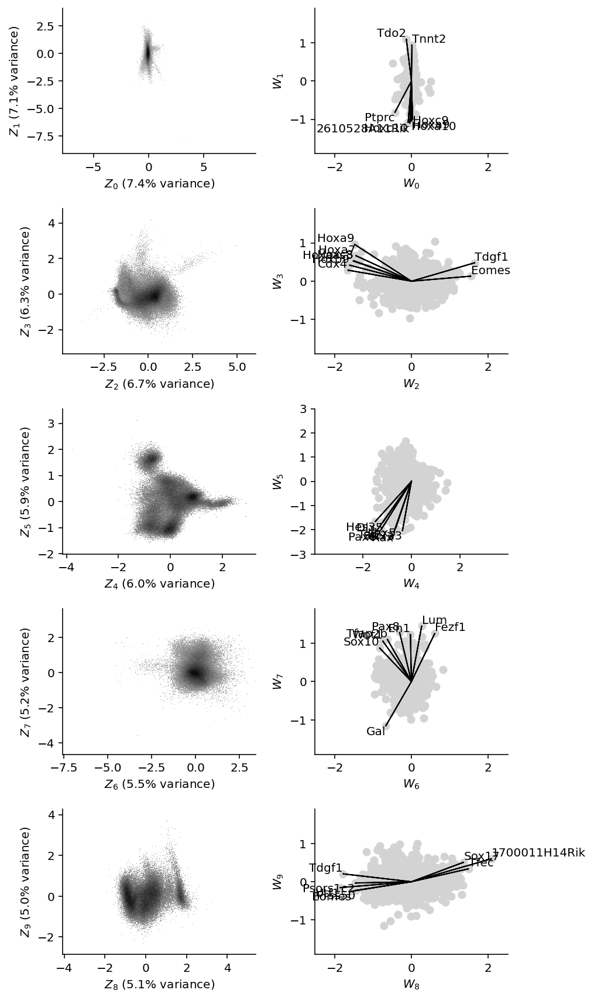

In [ ]:

figsize(7, 12)
for i in range(5):
    
    # -- Z plot --
    
    plt.subplot(5, 2, 2 * i + 1)
    
    plt.hist2d(
        Z_df_ordered[f'z{2 * i}'], Z_df_ordered[f'z{2 * i + 1}'],
        bins=256,
        norm=mcolors.PowerNorm(0.25),
        cmap=cm.gray_r,
        rasterized=True
    )
    plt.axis('equal');
    plt.xlabel(f'$Z_{2 * i}$ ({variance_explained[idx][2 * i]:.1%} variance)')
    plt.ylabel(f'$Z_{2 * i + 1}$ ({variance_explained[idx][2 * i + 1]:.1%} variance)')
    
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    

    #plt.xlim(left=-3, right=3)
    #plt.ylim(bottom=-3, top=3)
    
plt.tight_layout()
plt.savefig('figures/linear_pij_results.pdf', bbox_inches='tight', dpi=400)